# Monet Style Transfer with CycleGAN

**Project**: GAN Getting Started - I'm Something of a Painter Myself  
**Competition URL**: https://www.kaggle.com/competitions/gan-getting-started  
**GitHub Repository**: [INSERT YOUR GITHUB REPO URL HERE]

## Project Overview
This notebook implements a CycleGAN to transform photographs into Monet-style paintings using Kaggle's TPU v3-8 environment for accelerated training.

## 1. Problem and Data Description

### 1.1 Problem Statement
The goal of this competition is to build a Generative Adversarial Network (GAN) capable of generating 7,000-10,000 Monet-style paintings from photographs. This is an unpaired image-to-image translation task where we must learn the artistic style of Claude Monet and apply it to modern photographs without having paired training examples.

### 1.2 Dataset Description
The dataset consists of:
- **300 Monet paintings**: Authentic works by Claude Monet showcasing his impressionistic style
- **7,028 photographs**: Contemporary landscape and nature photographs
- **Image format**: 256×256 pixels, RGB color
- **Data format**: Available as both JPEG files and TFRecords for efficient loading

### 1.3 Evaluation Metric
The competition uses **MiFID (Memorization-Informed Fréchet Inception Distance)** which:
- Measures the quality and diversity of generated images
- Penalizes models that memorize training data
- Formula: `MiFID = FID / M(F_real, F_fake)`

## 2. Environment Setup and Imports

In [102]:
# TPU Detection and Setup
import tensorflow as tf
import os

# Detect TPU
try:
    #get tpu cluster resolver
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    #connect tpu cluster and initialize tpu system
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    #load TPU distribution strategy
    strategy = tf.distribute.TPUStrategy(tpu)
else:
    # Default to GPU/CPU strategy
    strategy = tf.distribute.get_strategy()

print("REPLICAS: ", strategy.num_replicas_in_sync)

REPLICAS:  1


In [103]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
import glob
import random
from PIL import Image
import gc

# TensorFlow imports
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
#!pip install tensorflow_addons
#import tensorflow_addons as tfa

# Set random seeds for reproducibility
SEED = 42
np.random.seed(SEED)
tf.random.set_seed(SEED)
random.seed(SEED)

# Visualization settings
plt.style.use('seaborn-v0_8-darkgrid')
%matplotlib inline

## 3. Configuration and Hyperparameters

In [104]:
# Configuration class to store parameters
class Config:
    # Data paths - Update these for Kaggle environment
    MONET_TFREC_PATH = '/kaggle/input/gan-getting-started/monet_tfrec/*.tfrec'
    PHOTO_TFREC_PATH = '/kaggle/input/gan-getting-started/photo_tfrec/*.tfrec'
    MONET_JPG_PATH = '/kaggle/input/gan-getting-started/monet_jpg/*.jpg'
    PHOTO_JPG_PATH = '/kaggle/input/gan-getting-started/photo_jpg/*.jpg'
    
    # Model parameters
    IMG_HEIGHT = 256
    IMG_WIDTH = 256
    CHANNELS = 3
    
    # Training parameters
    BATCH_SIZE = 16 * strategy.num_replicas_in_sync  # Scale batch size with TPU replicas
    EPOCHS = 20
    STEPS_PER_EPOCH = 100
    
    # Loss weights
    LAMBDA_CYCLE = 10.0
    LAMBDA_IDENTITY = 0.5
    
    # Optimizer parameters
    LEARNING_RATE = 2e-4
    BETA_1 = 0.5
    
    # Data augmentation
    AUGMENT = True
    ROTATION_RANGE = 10
    ZOOM_RANGE = 0.1
    
    # Model architecture
    N_RESNET_BLOCKS = 8
    NGF = 16  # Number of generator filters
    NDF = 16  # Number of discriminator filters
    
    # Output
    OUTPUT_IMAGES = 10000  # Number of images to generate for submission

config = Config()
print(f"Batch size: {config.BATCH_SIZE}")
print(f"Images per epoch: {config.BATCH_SIZE * config.STEPS_PER_EPOCH}")

Batch size: 16
Images per epoch: 1600


## 4. Data Loading and Preprocessing

### 4.1 TFRecord Parsing Functions

In [105]:
# Define feature description for TFRecords
IMAGE_SIZE = [config.IMG_HEIGHT, config.IMG_WIDTH]

def decode_image(image):
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.cast(image, tf.float32)
    image = tf.reshape(image, [*IMAGE_SIZE, 3])
    return image

def read_tfrecord(example):
    tfrecord_format = {
        "image": tf.io.FixedLenFeature([], tf.string)
    }
    example = tf.io.parse_single_example(example, tfrecord_format)
    image = decode_image(example['image'])
    return image

def load_dataset(filenames, batch_size, augment=False):
    """Load and prepare dataset from TFRecords"""
    dataset = tf.data.TFRecordDataset(filenames)
    dataset = dataset.map(read_tfrecord, num_parallel_calls=tf.data.AUTOTUNE)
    
    if augment:
        dataset = dataset.map(data_augment, num_parallel_calls=tf.data.AUTOTUNE)
    
    dataset = dataset.map(normalize_image, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.shuffle(2048)
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset

def normalize_image(image):
    """Normalize images to [-1, 1]"""
    return (image / 127.5) - 1.0

def denormalize_image(image):
    """Denormalize images from [-1, 1] to [0, 1]"""
    return (image + 1.0) / 2.0

### 4.2 Data Augmentation

In [106]:
def data_augment(image):
    """Apply data augmentation to images"""
    # Random horizontal flip
    image = tf.image.random_flip_left_right(image)
    
    # Random rotation
    #image = tfa.image.rotate(image, tf.random.uniform([], -config.ROTATION_RANGE * np.pi/180, 
                                                      #config.ROTATION_RANGE * np.pi/180))
    
    # Random zoom
    scales = tf.random.uniform([1], 1 - config.ZOOM_RANGE, 1 + config.ZOOM_RANGE)
    image = tf.image.resize(image, tf.cast([config.IMG_HEIGHT * scales[0], 
                                           config.IMG_WIDTH * scales[0]], tf.int32))
    image = tf.image.resize_with_crop_or_pad(image, config.IMG_HEIGHT, config.IMG_WIDTH)
    
    return image

### 4.3 Load Datasets

In [107]:
# Get file paths
monet_files = sorted(tf.io.gfile.glob(config.MONET_TFREC_PATH))
photo_files = sorted(tf.io.gfile.glob(config.PHOTO_TFREC_PATH))

print(f"Monet TFRecord files: {len(monet_files)}")
print(f"Photo TFRecord files: {len(photo_files)}")

# Create datasets
monet_dataset = load_dataset(monet_files, config.BATCH_SIZE, augment=config.AUGMENT)
photo_dataset = load_dataset(photo_files, config.BATCH_SIZE, augment=config.AUGMENT)

# Create cycled datasets for training
monet_dataset = monet_dataset.repeat()
photo_dataset = photo_dataset.repeat()

Monet TFRecord files: 5
Photo TFRecord files: 20


## 5. Exploratory Data Analysis (EDA)

### 5.1 Dataset Statistics

In [108]:
# Count images in JPEG folders for verification
monet_jpg_files = tf.io.gfile.glob(config.MONET_JPG_PATH)
photo_jpg_files = tf.io.gfile.glob(config.PHOTO_JPG_PATH)

print("Dataset Statistics:")
print(f"Monet paintings: {len(monet_jpg_files)}")
print(f"Photographs: {len(photo_jpg_files)}")
print(f"Ratio (Photos:Monet): {len(photo_jpg_files)/len(monet_jpg_files):.1f}:1")
print(f"\nTotal training images: {len(monet_jpg_files) + len(photo_jpg_files)}")
print(f"Images to generate: {config.OUTPUT_IMAGES}")

Dataset Statistics:
Monet paintings: 300
Photographs: 7038
Ratio (Photos:Monet): 23.5:1

Total training images: 7338
Images to generate: 10000


### 5.2 Visualize Sample Images

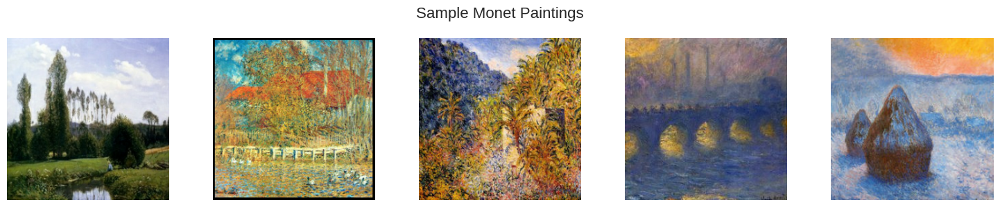

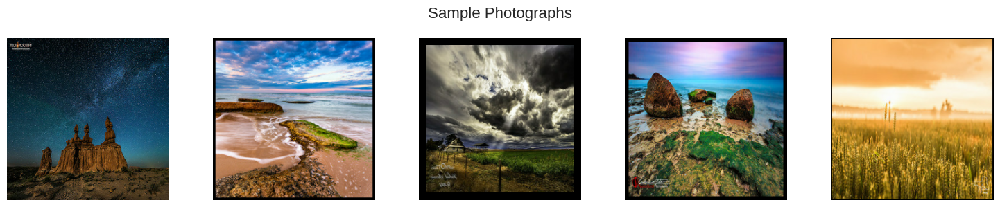

In [109]:
def visualize_samples(dataset, title, n_samples=5):
    """Visualize sample images from dataset"""
    plt.figure(figsize=(15, 3))
    
    for i, image in enumerate(dataset.take(n_samples)):
        if len(image.shape) == 4:  # Batch of images
            image = image[0]  # Take first image from batch
        
        plt.subplot(1, n_samples, i + 1)
        plt.imshow(denormalize_image(image))
        plt.axis('off')
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Visualize samples
visualize_samples(monet_dataset, "Sample Monet Paintings")
visualize_samples(photo_dataset, "Sample Photographs")

### 5.3 Color Distribution Analysis

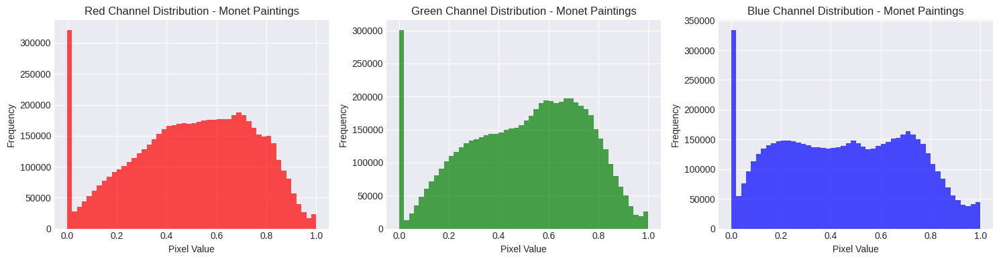

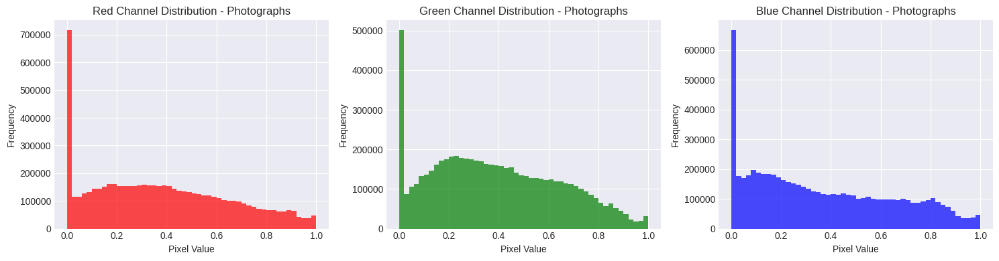

In [110]:
def analyze_color_distribution(dataset, name, n_samples=100):
    """Analyze RGB color distribution of dataset"""
    colors = []
    
    for batch in dataset.take(n_samples // config.BATCH_SIZE):
        batch_np = denormalize_image(batch).numpy()
        colors.append(batch_np.reshape(-1, 3))
    
    colors = np.concatenate(colors)
    
    # Plot histograms
    fig, axes = plt.subplots(1, 3, figsize=(15, 4))
    color_names = ['Red', 'Green', 'Blue']
    
    for i, (ax, color) in enumerate(zip(axes, color_names)):
        ax.hist(colors[:, i], bins=50, alpha=0.7, color=color.lower())
        ax.set_title(f'{color} Channel Distribution - {name}')
        ax.set_xlabel('Pixel Value')
        ax.set_ylabel('Frequency')
    
    plt.tight_layout()
    plt.show()
    
    return colors

# Analyze color distributions
monet_colors = analyze_color_distribution(monet_dataset, "Monet Paintings")
photo_colors = analyze_color_distribution(photo_dataset, "Photographs")

### 5.4 Style Characteristics Analysis

**TO BE COMPLETED AFTER ANALYSIS**:
- [ ] Describe the dominant color palette in Monet paintings vs photographs
- [ ] Note any specific patterns in brightness/contrast
- [ ] Identify key stylistic elements that the GAN should capture
- [ ] Discuss implications for model training

## 6. Model Architecture

### 6.1 Building Blocks

In [111]:
# Instance Normalization Layer
class InstanceNormalization(tf.keras.layers.Layer):
    def __init__(self, epsilon=1e-5):
        super(InstanceNormalization, self).__init__()
        self.epsilon = epsilon

    def build(self, input_shape):
        self.scale = self.add_weight(
            name='scale',
            shape=input_shape[-1:],
            initializer=tf.random_normal_initializer(1., 0.02),
            trainable=True)
        
        self.offset = self.add_weight(
            name='offset',
            shape=input_shape[-1:],
            initializer='zeros',
            trainable=True)

    def call(self, x):
        mean, variance = tf.nn.moments(x, axes=[1, 2], keepdims=True)
        inv = tf.math.rsqrt(variance + self.epsilon)
        normalized = (x - mean) * inv
        return self.scale * normalized + self.offset

# Residual Block
def residual_block(x, filters, kernel_size=3):
    """Residual block with instance normalization"""
    fx = layers.Conv2D(filters, kernel_size, padding='same')(x)
    fx = InstanceNormalization()(fx)
    fx = layers.ReLU()(fx)
    
    fx = layers.Conv2D(filters, kernel_size, padding='same')(fx)
    fx = InstanceNormalization()(fx)
    
    return layers.Add()([x, fx])

# Downsampling block
def downsample(x, filters, kernel_size=3, strides=2):
    x = layers.Conv2D(filters, kernel_size, strides=strides, padding='same')(x)
    x = InstanceNormalization()(x)
    x = layers.ReLU()(x)
    return x

# Upsampling block
def upsample(x, filters, kernel_size=3, strides=2):
    x = layers.Conv2DTranspose(filters, kernel_size, strides=strides, padding='same')(x)
    x = InstanceNormalization()(x)
    x = layers.ReLU()(x)
    return x

### 6.2 Generator Architecture (ResNet-based)

In [112]:
def build_generator(name='generator'):
    """Build ResNet-based generator for CycleGAN"""
    inputs = layers.Input(shape=[config.IMG_HEIGHT, config.IMG_WIDTH, config.CHANNELS])
    
    # Initial convolution block
    x = layers.Conv2D(config.NGF, 7, padding='same')(inputs)
    x = InstanceNormalization()(x)
    x = layers.ReLU()(x)
    
    # Downsampling
    x = downsample(x, config.NGF * 2)
    x = downsample(x, config.NGF * 4)
    
    # Residual blocks
    for _ in range(config.N_RESNET_BLOCKS):
        x = residual_block(x, config.NGF * 4)
    
    # Upsampling
    x = upsample(x, config.NGF * 2)
    x = upsample(x, config.NGF)
    
    # Output layer
    x = layers.Conv2D(config.CHANNELS, 7, padding='same')(x)
    outputs = layers.Activation('tanh')(x)
    
    return keras.Model(inputs=inputs, outputs=outputs, name=name)

### 6.3 Discriminator Architecture (PatchGAN)

In [113]:
def build_discriminator(name='discriminator'):
    """Build PatchGAN discriminator"""
    inputs = layers.Input(shape=[config.IMG_HEIGHT, config.IMG_WIDTH, config.CHANNELS])
    
    # First layer without instance norm
    x = layers.Conv2D(config.NDF, 4, strides=2, padding='same')(inputs)
    x = layers.LeakyReLU(0.2)(x)
    
    # Subsequent layers with instance norm
    x = layers.Conv2D(config.NDF * 2, 4, strides=2, padding='same')(x)
    x = InstanceNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)
    
    x = layers.Conv2D(config.NDF * 4, 4, strides=2, padding='same')(x)
    x = InstanceNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)
    
    x = layers.Conv2D(config.NDF * 8, 4, strides=1, padding='same')(x)
    x = InstanceNormalization()(x)
    x = layers.LeakyReLU(0.2)(x)
    
    # Output layer
    outputs = layers.Conv2D(1, 4, strides=1, padding='same')(x)
    
    return keras.Model(inputs=inputs, outputs=outputs, name=name)

### 6.4 Build Models with TPU Strategy

In [114]:
with strategy.scope():
    # Generators
    gen_G = build_generator(name='generator_G')  # Photo to Monet
    gen_F = build_generator(name='generator_F')  # Monet to Photo
    
    # Discriminators
    disc_X = build_discriminator(name='discriminator_X')  # For Monet images
    disc_Y = build_discriminator(name='discriminator_Y')  # For Photo images
    
    # Optimizers
    gen_G_optimizer = keras.optimizers.Adam(config.LEARNING_RATE, beta_1=config.BETA_1)
    gen_F_optimizer = keras.optimizers.Adam(config.LEARNING_RATE, beta_1=config.BETA_1)
    disc_X_optimizer = keras.optimizers.Adam(config.LEARNING_RATE, beta_1=config.BETA_1)
    disc_Y_optimizer = keras.optimizers.Adam(config.LEARNING_RATE, beta_1=config.BETA_1)

# Print model summaries
print("Generator Architecture:")
gen_G.summary()
print("\nDiscriminator Architecture:")
disc_X.summary()

Generator Architecture:


Model: "generator_G"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_24            │ (None, 256, 256, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_264 (Conv2D)       │ (None, 256, 256, 16)   │          2,368 │ input_layer_24[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ instance_normalization_2… │ (None, 256, 256, 16)   │             32 │ conv2d_264[0][0]       │
│ (InstanceNormalization)   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_138 (ReLU)          │ (None, 256, 256, 16)   │              0 │ instance_normalizatio… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_265 (Conv2D)       │ (None, 128, 128, 32)   │          4,640 │ re_lu_138[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ instance_normalization_2… │ (None, 128, 128, 32)   │             64 │ conv2d_265[0][0]       │
│ (InstanceNormalization)   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_139 (ReLU)          │ (None, 128, 128, 32)   │              0 │ instance_normalizatio… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_266 (Conv2D)       │ (None, 64, 64, 64)     │         18,496 │ re_lu_139[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ instance_normalization_2… │ (None, 64, 64, 64)     │            128 │ conv2d_266[0][0]       │
│ (InstanceNormalization)   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_140 (ReLU)          │ (None, 64, 64, 64)     │              0 │ instance_normalizatio… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_267 (Conv2D)       │ (None, 64, 64, 64)     │         36,928 │ re_lu_140[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ instance_normalization_2… │ (None, 64, 64, 64)     │            128 │ conv2d_267[0][0]       │
│ (InstanceNormalization)   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ re_lu_141 (ReLU)          │ (None, 64, 64, 64)     │              0 │ instance_normalizatio… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_268 (Conv2D)       │ (None, 64, 64, 64)     │         36,928 │ re_lu_141[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ instance_normalization_2… │ (None, 64, 64, 64)     │            128 │ conv2d_268[0][0]       │
│ (InstanceNormalization)   │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add_78 (Add)              │ (None, 64, 64, 64)     │              0 │ re_lu_140[0][0],       │
│                           │                        │                │ instance_normalizatio… │
├──────────────────────

 Total params: 644,163 (2.46 MB)

 Trainable params: 644,163 (2.46 MB)

 Non-trainable params: 0 (0.00 B)


Discriminator Architecture:


Model: "discriminator_X"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_26 (InputLayer)          │ (None, 256, 256, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_304 (Conv2D)                  │ (None, 128, 128, 16)        │             784 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_48 (LeakyReLU)           │ (None, 128, 128, 16)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_305 (Conv2D)                  │ (None, 64, 64, 32)          │           8,224 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ instance_normalization_294           │ (None, 64, 64, 32)          │              64 │
│ (InstanceNormalization)              │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_49 (LeakyReLU)           │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_306 (Conv2D)                  │ (None, 32, 32, 64)          │          32,832 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ instance_normalization_295           │ (None, 32, 32, 64)          │             128 │
│ (InstanceNormalization)              │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_50 (LeakyReLU)           │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_307 (Conv2D)                  │ (None, 32, 32, 128)         │         131,200 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ instance_normalization_296           │ (None, 32, 32, 128)         │             256 │
│ (InstanceNormalization)              │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ leaky_re_lu_51 (LeakyReLU)           │ (None, 32, 32, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_308 (Conv2D)                  │ (None, 32, 32, 1)           │           2,049 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 175,537 (685.69 KB)

 Trainable params: 175,537 (685.69 KB)

 Non-trainable params: 0 (0.00 B)

## 7. Loss Functions

### 7.1 Define Loss Functions

In [115]:
# Loss function for discriminators (LSGAN)
def discriminator_loss(real, generated):
    real_loss = tf.reduce_mean(tf.square(real - 1))
    generated_loss = tf.reduce_mean(tf.square(generated))
    total_loss = (real_loss + generated_loss) * 0.5
    return total_loss

# Loss function for generators (LSGAN)
def generator_loss(generated):
    return tf.reduce_mean(tf.square(generated - 1))

# Cycle consistency loss
def cycle_loss(real_image, cycled_image):
    return tf.reduce_mean(tf.abs(real_image - cycled_image))

# Identity loss
def identity_loss(real_image, same_image):
    return tf.reduce_mean(tf.abs(real_image - same_image))

## 8. Training

### 8.1 Training Step

In [116]:
@tf.function
def train_step(real_x, real_y):
    """Execute one training step"""
    with tf.GradientTape(persistent=True) as tape:
        # Generator outputs
        fake_y = gen_G(real_x, training=True)
        fake_x = gen_F(real_y, training=True)
        
        # Cycle outputs
        cycled_x = gen_F(fake_y, training=True)
        cycled_y = gen_G(fake_x, training=True)
        
        # Identity outputs
        same_x = gen_F(real_x, training=True)
        same_y = gen_G(real_y, training=True)
        
        # Discriminator outputs
        disc_real_x = disc_X(real_x, training=True)
        disc_fake_x = disc_X(fake_x, training=True)
        disc_real_y = disc_Y(real_y, training=True)
        disc_fake_y = disc_Y(fake_y, training=True)
        
        # Calculate losses
        gen_G_loss = generator_loss(disc_fake_y)
        gen_F_loss = generator_loss(disc_fake_x)
        
        total_cycle_loss = cycle_loss(real_x, cycled_x) + cycle_loss(real_y, cycled_y)
        
        total_gen_G_loss = gen_G_loss + config.LAMBDA_CYCLE * total_cycle_loss + config.LAMBDA_IDENTITY * identity_loss(real_y, same_y)
        total_gen_F_loss = gen_F_loss + config.LAMBDA_CYCLE * total_cycle_loss + config.LAMBDA_IDENTITY * identity_loss(real_x, same_x)
        
        disc_X_loss = discriminator_loss(disc_real_x, disc_fake_x)
        disc_Y_loss = discriminator_loss(disc_real_y, disc_fake_y)
    
    # Calculate gradients
    gen_G_gradients = tape.gradient(total_gen_G_loss, gen_G.trainable_variables)
    gen_F_gradients = tape.gradient(total_gen_F_loss, gen_F.trainable_variables)
    disc_X_gradients = tape.gradient(disc_X_loss, disc_X.trainable_variables)
    disc_Y_gradients = tape.gradient(disc_Y_loss, disc_Y.trainable_variables)
    
    # Apply gradients
    gen_G_optimizer.apply_gradients(zip(gen_G_gradients, gen_G.trainable_variables))
    gen_F_optimizer.apply_gradients(zip(gen_F_gradients, gen_F.trainable_variables))
    disc_X_optimizer.apply_gradients(zip(disc_X_gradients, disc_X.trainable_variables))
    disc_Y_optimizer.apply_gradients(zip(disc_Y_gradients, disc_Y.trainable_variables))
    
    return {
        'gen_G_loss': total_gen_G_loss,
        'gen_F_loss': total_gen_F_loss,
        'disc_X_loss': disc_X_loss,
        'disc_Y_loss': disc_Y_loss,
        'cycle_loss': total_cycle_loss
    }

### 8.2 Training Loop

Starting training...
Epoch 1/20, Step 0/100, Gen G: 15.8623, Gen F: 15.5730, Disc X: 1.3705, Disc Y: 1.6144
Epoch 1/20, Step 10/100, Gen G: 10.0252, Gen F: 10.0050, Disc X: 0.4803, Disc Y: 0.5042
Epoch 1/20, Step 20/100, Gen G: 8.1843, Gen F: 8.1587, Disc X: 0.3455, Disc Y: 0.4673
Epoch 1/20, Step 30/100, Gen G: 6.9487, Gen F: 6.9370, Disc X: 0.2980, Disc Y: 0.3405
Epoch 1/20, Step 40/100, Gen G: 6.8804, Gen F: 6.9120, Disc X: 0.2610, Disc Y: 0.3187
Epoch 1/20, Step 50/100, Gen G: 6.5262, Gen F: 6.5595, Disc X: 0.2730, Disc Y: 0.2995
Epoch 1/20, Step 60/100, Gen G: 6.4189, Gen F: 6.3745, Disc X: 0.2625, Disc Y: 0.3522
Epoch 1/20, Step 70/100, Gen G: 6.0998, Gen F: 6.1652, Disc X: 0.2418, Disc Y: 0.2814
Epoch 1/20, Step 80/100, Gen G: 5.7051, Gen F: 5.7266, Disc X: 0.2550, Disc Y: 0.2779
Epoch 1/20, Step 90/100, Gen G: 5.9754, Gen F: 6.0218, Disc X: 0.2422, Disc Y: 0.2598

Epoch 1 completed in 0:03:40.393967
Average losses - Gen G: 7.2796, Gen F: 7.2763, Disc X: 0.3359, Disc Y: 0.3675



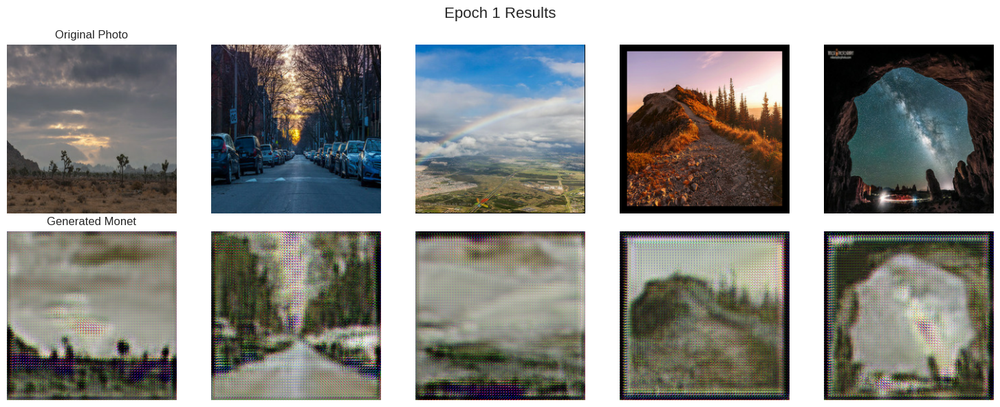

Epoch 2/20, Step 0/100, Gen G: 5.6671, Gen F: 5.6873, Disc X: 0.2377, Disc Y: 0.2716
Epoch 2/20, Step 10/100, Gen G: 6.2280, Gen F: 6.2376, Disc X: 0.2345, Disc Y: 0.2446
Epoch 2/20, Step 20/100, Gen G: 5.1563, Gen F: 5.1476, Disc X: 0.2272, Disc Y: 0.2471
Epoch 2/20, Step 30/100, Gen G: 5.7144, Gen F: 5.7441, Disc X: 0.2312, Disc Y: 0.2487
Epoch 2/20, Step 40/100, Gen G: 5.1162, Gen F: 5.1598, Disc X: 0.2739, Disc Y: 0.2368
Epoch 2/20, Step 50/100, Gen G: 5.0295, Gen F: 4.9550, Disc X: 0.2411, Disc Y: 0.2843
Epoch 2/20, Step 60/100, Gen G: 5.2344, Gen F: 5.2575, Disc X: 0.2236, Disc Y: 0.2261
Epoch 2/20, Step 70/100, Gen G: 5.2086, Gen F: 5.2004, Disc X: 0.2127, Disc Y: 0.2311
Epoch 2/20, Step 80/100, Gen G: 4.9617, Gen F: 4.9425, Disc X: 0.2338, Disc Y: 0.2218
Epoch 2/20, Step 90/100, Gen G: 5.9186, Gen F: 5.9131, Disc X: 0.2060, Disc Y: 0.2079

Epoch 2 completed in 0:01:38.830614
Average losses - Gen G: 5.3563, Gen F: 5.3615, Disc X: 0.2326, Disc Y: 0.2386

Generating sample images.

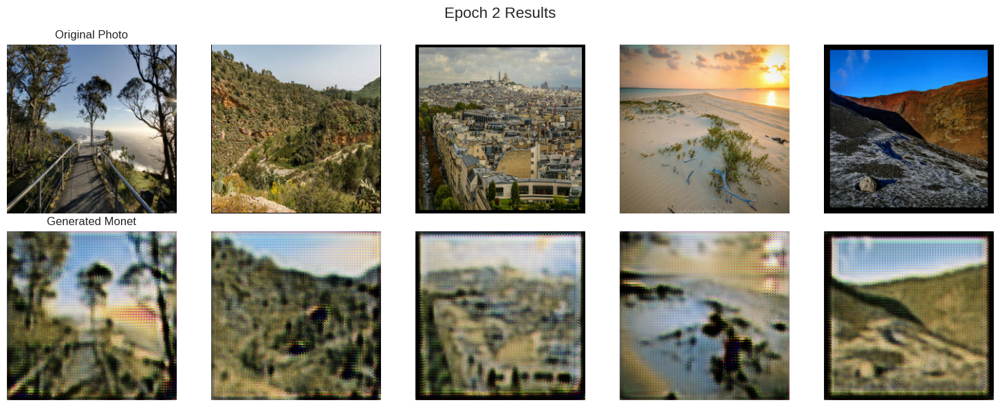

Epoch 3/20, Step 0/100, Gen G: 5.1380, Gen F: 5.1038, Disc X: 0.2230, Disc Y: 0.2314
Epoch 3/20, Step 10/100, Gen G: 5.0804, Gen F: 5.0914, Disc X: 0.2212, Disc Y: 0.2430
Epoch 3/20, Step 20/100, Gen G: 4.7901, Gen F: 4.7548, Disc X: 0.2207, Disc Y: 0.2095
Epoch 3/20, Step 30/100, Gen G: 4.8958, Gen F: 4.8689, Disc X: 0.2249, Disc Y: 0.2290
Epoch 3/20, Step 40/100, Gen G: 4.8403, Gen F: 4.8846, Disc X: 0.1989, Disc Y: 0.2245
Epoch 3/20, Step 50/100, Gen G: 5.2593, Gen F: 5.1782, Disc X: 0.2111, Disc Y: 0.2205
Epoch 3/20, Step 60/100, Gen G: 4.5097, Gen F: 4.4941, Disc X: 0.2130, Disc Y: 0.2285
Epoch 3/20, Step 70/100, Gen G: 4.8681, Gen F: 4.9385, Disc X: 0.2372, Disc Y: 0.2250
Epoch 3/20, Step 80/100, Gen G: 4.8487, Gen F: 4.8580, Disc X: 0.2189, Disc Y: 0.1927
Epoch 3/20, Step 90/100, Gen G: 4.8887, Gen F: 4.8725, Disc X: 0.2503, Disc Y: 0.2188

Epoch 3 completed in 0:01:38.947801
Average losses - Gen G: 4.8545, Gen F: 4.8511, Disc X: 0.2210, Disc Y: 0.2241

Generating sample images.

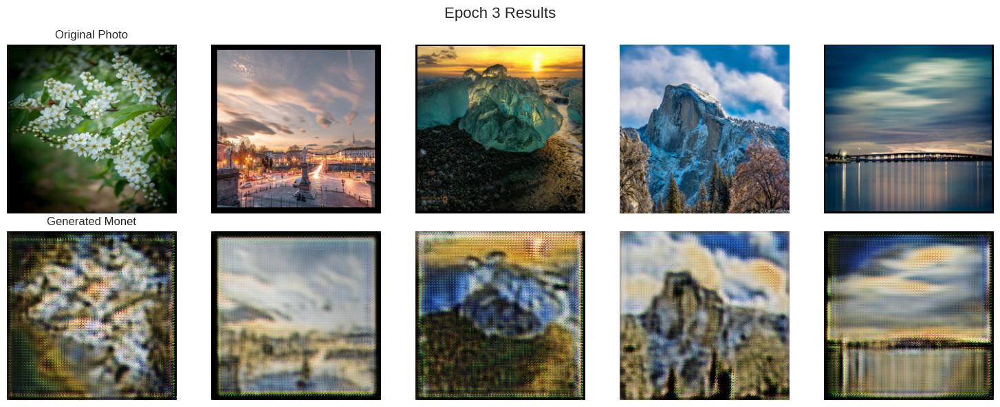

Epoch 4/20, Step 0/100, Gen G: 4.5969, Gen F: 4.6933, Disc X: 0.2094, Disc Y: 0.2358
Epoch 4/20, Step 10/100, Gen G: 4.9483, Gen F: 4.9376, Disc X: 0.2214, Disc Y: 0.2094
Epoch 4/20, Step 20/100, Gen G: 4.6783, Gen F: 4.6557, Disc X: 0.2246, Disc Y: 0.2385
Epoch 4/20, Step 30/100, Gen G: 4.6199, Gen F: 4.6468, Disc X: 0.2172, Disc Y: 0.2212
Epoch 4/20, Step 40/100, Gen G: 4.4150, Gen F: 4.4415, Disc X: 0.2319, Disc Y: 0.2397
Epoch 4/20, Step 50/100, Gen G: 4.6573, Gen F: 4.6324, Disc X: 0.2421, Disc Y: 0.2563
Epoch 4/20, Step 60/100, Gen G: 4.6455, Gen F: 4.6604, Disc X: 0.2255, Disc Y: 0.2210
Epoch 4/20, Step 70/100, Gen G: 4.2951, Gen F: 4.3176, Disc X: 0.1992, Disc Y: 0.2142
Epoch 4/20, Step 80/100, Gen G: 4.3477, Gen F: 4.3943, Disc X: 0.2101, Disc Y: 0.2189
Epoch 4/20, Step 90/100, Gen G: 4.7790, Gen F: 4.7909, Disc X: 0.2383, Disc Y: 0.2313

Epoch 4 completed in 0:01:39.002342
Average losses - Gen G: 4.6217, Gen F: 4.6232, Disc X: 0.2182, Disc Y: 0.2261

Generating sample images.

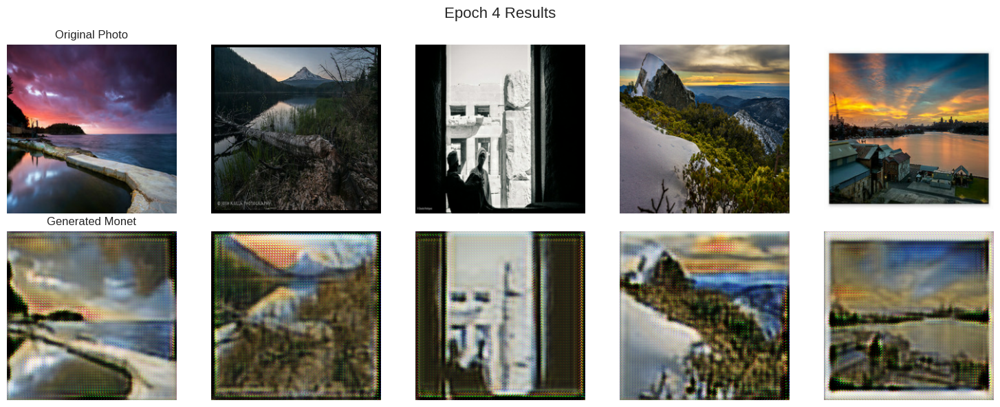

Epoch 5/20, Step 0/100, Gen G: 4.4734, Gen F: 4.3854, Disc X: 0.2266, Disc Y: 0.2458
Epoch 5/20, Step 10/100, Gen G: 4.3411, Gen F: 4.4018, Disc X: 0.2203, Disc Y: 0.2001
Epoch 5/20, Step 20/100, Gen G: 4.7731, Gen F: 4.7633, Disc X: 0.2266, Disc Y: 0.1913
Epoch 5/20, Step 30/100, Gen G: 4.5218, Gen F: 4.5823, Disc X: 0.1903, Disc Y: 0.1974
Epoch 5/20, Step 40/100, Gen G: 4.4904, Gen F: 4.5511, Disc X: 0.2376, Disc Y: 0.2226
Epoch 5/20, Step 50/100, Gen G: 5.0774, Gen F: 5.0871, Disc X: 0.2152, Disc Y: 0.2032
Epoch 5/20, Step 60/100, Gen G: 4.7353, Gen F: 4.7521, Disc X: 0.2237, Disc Y: 0.2371
Epoch 5/20, Step 70/100, Gen G: 4.0380, Gen F: 4.0981, Disc X: 0.2072, Disc Y: 0.2124
Epoch 5/20, Step 80/100, Gen G: 4.5249, Gen F: 4.5166, Disc X: 0.1997, Disc Y: 0.2086
Epoch 5/20, Step 90/100, Gen G: 4.5613, Gen F: 4.5310, Disc X: 0.2178, Disc Y: 0.2036

Epoch 5 completed in 0:01:38.896872
Average losses - Gen G: 4.4707, Gen F: 4.4786, Disc X: 0.2161, Disc Y: 0.2186

Generating sample images.

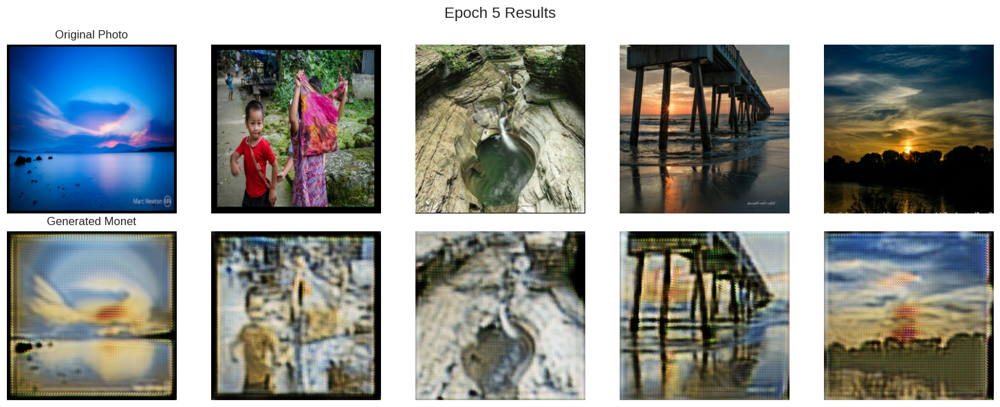

Epoch 6/20, Step 0/100, Gen G: 4.9643, Gen F: 5.1336, Disc X: 0.2187, Disc Y: 0.2299


In [ ]:
# Distributed training step
@tf.function
def distributed_train_step(dist_inputs):
    per_replica_losses = strategy.run(train_step, args=dist_inputs)
    return {k: strategy.reduce(tf.distribute.ReduceOp.MEAN, v, axis=None) 
            for k, v in per_replica_losses.items()}

# Training history
history = {
    'gen_G_loss': [],
    'gen_F_loss': [],
    'disc_X_loss': [],
    'disc_Y_loss': [],
    'cycle_loss': []
}

# Create distributed datasets
dist_monet_dataset = strategy.experimental_distribute_dataset(monet_dataset)
dist_photo_dataset = strategy.experimental_distribute_dataset(photo_dataset)

# Training loop
print("Starting training...")
start_time = datetime.now()

for epoch in range(config.EPOCHS):
    epoch_start = datetime.now()
    
    # Initialize epoch losses
    epoch_losses = {k: [] for k in history.keys()}
    
    # Train for one epoch
    for step, (monet_batch, photo_batch) in enumerate(zip(dist_monet_dataset, dist_photo_dataset)):
        if step >= config.STEPS_PER_EPOCH:
            break
            
        losses = distributed_train_step((photo_batch, monet_batch))
        
        # Record losses
        for k, v in losses.items():
            epoch_losses[k].append(v)
        
        # Print progress
        if step % 10 == 0:
            print(f"Epoch {epoch+1}/{config.EPOCHS}, Step {step}/{config.STEPS_PER_EPOCH}, "
                  f"Gen G: {losses['gen_G_loss']:.4f}, Gen F: {losses['gen_F_loss']:.4f}, "
                  f"Disc X: {losses['disc_X_loss']:.4f}, Disc Y: {losses['disc_Y_loss']:.4f}")
    
    # Record epoch average losses
    for k in history.keys():
        history[k].append(np.mean(epoch_losses[k]))
    
    # Print epoch summary
    epoch_time = datetime.now() - epoch_start
    print(f"\nEpoch {epoch+1} completed in {epoch_time}")
    print(f"Average losses - Gen G: {history['gen_G_loss'][-1]:.4f}, "
          f"Gen F: {history['gen_F_loss'][-1]:.4f}, "
          f"Disc X: {history['disc_X_loss'][-1]:.4f}, "
          f"Disc Y: {history['disc_Y_loss'][-1]:.4f}\n")
    
    # Generate sample images every 1 epochs
    if (epoch + 1) % 1 == 0:
        print("Generating sample images...")
        for sample_photo in photo_dataset.take(1):
            generated_monet = gen_G(sample_photo[:5], training=False)
            
            plt.figure(figsize=(15, 6))
            for i in range(5):
                # Original photo
                plt.subplot(2, 5, i + 1)
                plt.imshow(denormalize_image(sample_photo[i]))
                plt.axis('off')
                if i == 0:
                    plt.title('Original Photo')
                
                # Generated Monet
                plt.subplot(2, 5, i + 6)
                plt.imshow(denormalize_image(generated_monet[i]))
                plt.axis('off')
                if i == 0:
                    plt.title('Generated Monet')
            
            plt.suptitle(f'Epoch {epoch+1} Results', fontsize=16)
            plt.tight_layout()
            plt.show()

total_time = datetime.now() - start_time
print(f"\nTraining completed in {total_time}")

### 8.3 Plot Training History

In [ ]:
# Plot training history
fig, axes = plt.subplots(2, 2, figsize=(15, 10))

# Generator losses
axes[0, 0].plot(history['gen_G_loss'], label='Generator G (Photo→Monet)')
axes[0, 0].plot(history['gen_F_loss'], label='Generator F (Monet→Photo)')
axes[0, 0].set_title('Generator Losses')
axes[0, 0].set_xlabel('Epoch')
axes[0, 0].set_ylabel('Loss')
axes[0, 0].legend()
axes[0, 0].grid(True)

# Discriminator losses
axes[0, 1].plot(history['disc_X_loss'], label='Discriminator X (Monet)')
axes[0, 1].plot(history['disc_Y_loss'], label='Discriminator Y (Photo)')
axes[0, 1].set_title('Discriminator Losses')
axes[0, 1].set_xlabel('Epoch')
axes[0, 1].set_ylabel('Loss')
axes[0, 1].legend()
axes[0, 1].grid(True)

# Cycle consistency loss
axes[1, 0].plot(history['cycle_loss'], label='Cycle Consistency Loss', color='green')
axes[1, 0].set_title('Cycle Consistency Loss')
axes[1, 0].set_xlabel('Epoch')
axes[1, 0].set_ylabel('Loss')
axes[1, 0].legend()
axes[1, 0].grid(True)

# Combined view
axes[1, 1].plot(history['gen_G_loss'], label='Gen G', alpha=0.7)
axes[1, 1].plot(history['gen_F_loss'], label='Gen F', alpha=0.7)
axes[1, 1].plot(history['disc_X_loss'], label='Disc X', alpha=0.7)
axes[1, 1].plot(history['disc_Y_loss'], label='Disc Y', alpha=0.7)
axes[1, 1].set_title('All Losses')
axes[1, 1].set_xlabel('Epoch')
axes[1, 1].set_ylabel('Loss')
axes[1, 1].legend()
axes[1, 1].grid(True)

plt.tight_layout()
plt.show()

## 9. Results

### 9.1 Generate Test Images

In [ ]:
def generate_and_display_images(generator, dataset, n_samples=10, title="Generated Images"):
    """Generate and display images using the trained generator"""
    fig, axes = plt.subplots(2, n_samples//2, figsize=(20, 8))
    axes = axes.flatten()
    
    sample_count = 0
    for batch in dataset.take(n_samples // config.BATCH_SIZE + 1):
        generated = generator(batch, training=False)
        
        for i in range(min(len(generated), n_samples - sample_count)):
            axes[sample_count * 2].imshow(denormalize_image(batch[i]))
            axes[sample_count * 2].set_title('Original')
            axes[sample_count * 2].axis('off')
            
            axes[sample_count * 2 + 1].imshow(denormalize_image(generated[i]))
            axes[sample_count * 2 + 1].set_title('Generated')
            axes[sample_count * 2 + 1].axis('off')
            
            sample_count += 1
            if sample_count >= n_samples//2:
                break
                
        if sample_count >= n_samples//2:
            break
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

# Generate test images
print("Generating test images...")
generate_and_display_images(gen_G, photo_dataset, n_samples=10, 
                          title="Photo to Monet Style Transfer Results")

### 9.2 Generate Competition Submission

In [ ]:
# Create submission directory
import shutil
submission_dir = '/kaggle/working/images'
if os.path.exists(submission_dir):
    shutil.rmtree(submission_dir)
os.makedirs(submission_dir)

# Generate submission images
print(f"Generating {config.OUTPUT_IMAGES} images for submission...")

# Load all photo files for generation
photo_files_all = sorted(tf.io.gfile.glob(config.PHOTO_JPG_PATH))
n_photos = len(photo_files_all)

# Calculate how many times to cycle through photos
n_cycles = config.OUTPUT_IMAGES // n_photos + 1

image_count = 0
batch_photos = []

for cycle in range(n_cycles):
    for photo_path in photo_files_all:
        if image_count >= config.OUTPUT_IMAGES:
            break
            
        # Read and preprocess image
        image = tf.io.read_file(photo_path)
        image = decode_image(image)
        image = normalize_image(image)
        batch_photos.append(image)
        
        # Process batch when full or at the end
        if len(batch_photos) == config.BATCH_SIZE or \
           (image_count + len(batch_photos) >= config.OUTPUT_IMAGES):
            
            batch = tf.stack(batch_photos)
            generated = gen_G(batch, training=False)
            
            # Save generated images
            for i, gen_image in enumerate(generated):
                if image_count >= config.OUTPUT_IMAGES:
                    break
                    
                # Denormalize and convert to uint8
                gen_image = denormalize_image(gen_image)
                gen_image = tf.cast(gen_image * 255, tf.uint8)
                
                # Save image
                filename = f'{submission_dir}/{image_count:05d}.jpg'
                encoded = tf.io.encode_jpeg(gen_image)
                tf.io.write_file(filename, encoded)
                
                image_count += 1
                
                if image_count % 1000 == 0:
                    print(f"Generated {image_count}/{config.OUTPUT_IMAGES} images")
            
            batch_photos = []
    
    if image_count >= config.OUTPUT_IMAGES:
        break

print(f"\nGenerated {image_count} images successfully!")

# Verify submission
submission_files = tf.io.gfile.glob(f'{submission_dir}/*.jpg')
print(f"Submission directory contains {len(submission_files)} images")

In [ ]:
import zipfile

def zip_directory(folder_path, zip_path):
    """
    Zips the contents of folder_path into a zip file at zip_path.

    Args:
        folder_path (str): The path to the folder to zip.
        zip_path (str): The output path for the zip file.
    """
    with zipfile.ZipFile(zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
        for root, dirs, files in os.walk(folder_path):
            for file in files:
                full_path = os.path.join(root, file)
                # Preserve folder structure
                arcname = os.path.relpath(full_path, folder_path)
                zipf.write(full_path, arcname)

zip_directory('/kaggle/working/images', '/kaggle/working/images.zip')

### 9.3 Visualize Final Results

**TO BE COMPLETED AFTER TRAINING**:
- [ ] Describe the quality of generated Monet-style images
- [ ] Note any artifacts or issues in the generated images
- [ ] Compare different epochs to show improvement over time
- [ ] Identify which types of photos work best/worst for style transfer

## 10. Model Evaluation

### 10.1 Qualitative Evaluation

**TO BE COMPLETED AFTER RESULTS**:
- [ ] Assess how well the model captures Monet's color palette
- [ ] Evaluate the brushstroke-like effects in generated images
- [ ] Check for preservation of content/structure from original photos
- [ ] Note any mode collapse or lack of diversity in outputs

### 10.2 Save Models

In [ ]:
# Save trained models
model_dir = '/kaggle/working/models'
os.makedirs(model_dir, exist_ok=True)

# Save generators
gen_G.save(f'{model_dir}/generator_photo_to_monet.h5')
gen_F.save(f'{model_dir}/generator_monet_to_photo.h5')

# Save discriminators
disc_X.save(f'{model_dir}/discriminator_monet.h5')
disc_Y.save(f'{model_dir}/discriminator_photo.h5')

print("Models saved successfully!")

## 11. Discussion and Conclusion

### 11.1 Key Findings

**TO BE COMPLETED AFTER FULL ANALYSIS**:
- [ ] Summarize the effectiveness of CycleGAN for this task
- [ ] Discuss the impact of different hyperparameters (cycle loss weight, identity loss, etc.)
- [ ] Note the training stability and any challenges encountered
- [ ] Compare results with expected outcomes based on literature

### 11.2 Challenges Encountered

**TO BE COMPLETED**:
- [ ] Dataset imbalance (300 Monet vs 7,028 photos) and its impact
- [ ] Training stability issues and how they were addressed
- [ ] Computational requirements and TPU utilization
- [ ] Any mode collapse or other GAN-specific problems

### 11.3 Potential Improvements

**TO BE COMPLETED**:
- [ ] Architectural modifications that could improve results
- [ ] Data augmentation strategies to address imbalance
- [ ] Different loss functions or weights to explore
- [ ] Post-processing techniques for better image quality

### 11.4 Kaggle Competition Results

**TO BE COMPLETED AFTER SUBMISSION**:
- [ ] Include screenshot of Kaggle leaderboard position
- [ ] Report final MiFID score achieved
- [ ] Compare performance with other participants
- [ ] Discuss what strategies led to this performance

### 11.5 Learning Outcomes

**TO BE COMPLETED**:
- [ ] Technical skills gained (GANs, TPU usage, TensorFlow)
- [ ] Understanding of artistic style transfer
- [ ] Experience with unpaired image-to-image translation
- [ ] Insights into GAN training challenges and solutions

## 12. References

1. Zhu, J. Y., Park, T., Isola, P., & Efros, A. A. (2017). Unpaired image-to-image translation using cycle-consistent adversarial networks. In Proceedings of the IEEE international conference on computer vision (pp. 2223-2232).

2. Kaggle Competition: I'm Something of a Painter Myself. https://www.kaggle.com/competitions/gan-getting-started

3. TensorFlow CycleGAN Tutorial. https://www.tensorflow.org/tutorials/generative/cyclegan

4. Instance Normalization: The Missing Ingredient for Fast Stylization. Ulyanov, D., Vedaldi, A., & Lempitsky, V. (2016).

---

**GitHub Repository**: [INSERT YOUR REPO URL HERE]  
**Kaggle Notebook**: [INSERT KAGGLE NOTEBOOK URL HERE]